In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
from IPython.display import Audio, display
from scipy import signal

# audio example
samples, fs = librosa.load("audio_examples/voice.wav", sr=44100)

# **Basic Delay Strucutures**

## **FIR Comb Filter**

A FIR comb filter creates a time-delayed copy of an input signal and combines it with the original signal. The filter has two parameters:
- $t$: Time delay
- $g$: Gain (relative amplitude) of the delayed signal

The **difference equation** is:

$\large y(n) = x(n) + gx(n - M)$

where  $\large M = t \cdot f_s$ 

The **transfer function** is:

$\large H(z) = 1 + gz^{-M}$

For positive values of $g$, the frequency response shows periodic peaks at multiples of $1/t$ Hz. The magnitude response oscillates between $1 + g$ and $1 - g$, creating a comb-like pattern of alternating amplification and attenuation.

**Example**

Note that for example below, when M is not an integer, linear interpolation is used between adjacent samples to achieve more accurate fractional delays.


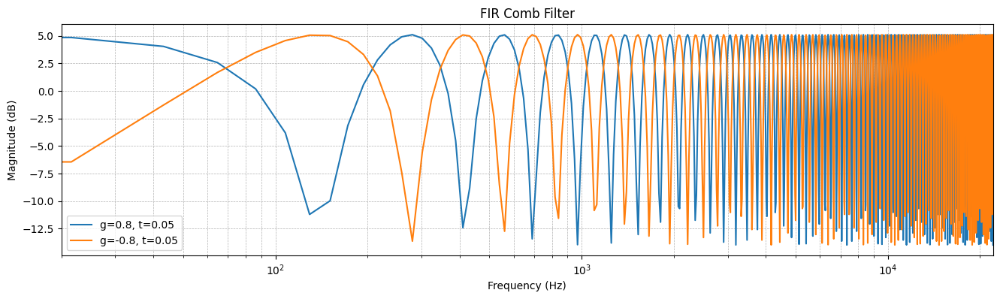

delayed g=0.8 , t=0.05


delayed g=-0.8 , t=0.05


In [38]:

def fir_comb_filter(x, t, g, fs):
    N = len(x)
    y = np.zeros(N)
    M = int(t * fs)
    frac =  (t * fs) - M
    
    for n in range(N):
        if n < M:
            y[n] = x[n]
            continue

        y[n] = x[n] + g * x[n - M]

        # interpolate with we have floating point M
        if frac != 0 and n > M:
            y[n] *= (1 - frac) + x[n - M -1] * frac
            
    return y

def fir_comb_filter_freq_response(t, g ,fs, n_points=1024):
    w = np.linspace(0, np.pi, n_points)
    H = np.zeros_like(w, dtype=complex)
    M = int(t * fs)

    for i, omega in enumerate(w):
        z = np.exp(1j * omega)

        H[i] = 1 + g * z**-M

    freqs = (w * fs) / (np.pi * 2)

    # return in mag db for convinience
    return freqs, 20 * np.log10(np.abs(H))


gs = [0.8, -0.8]
ts = [0.05,  0.05]
colors = ['#1f77b4', '#ff7f0e']

plt.figure(figsize=(16, 4))

for g, t, color in zip(gs, ts, colors):
    freqs, mags = fir_comb_filter_freq_response(t, g, fs)
    plt.plot(freqs, mags, color=color, label=f"g={g}, t={t}")

plt.xscale('log')
plt.xlim(20, fs / 2)  
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude (dB)")
plt.title(f"FIR Comb Filter")
plt.legend()
plt.grid(True, which="both", ls="--", lw=0.5)
plt.show()

neg_delyed = fir_comb_filter(samples, ts[1], gs[1], fs)

for g, t in zip(gs, ts):
    print(f"delayed g={g} , t={t}")
    delayed = fir_comb_filter(samples, t, g, fs)
    display(Audio(delayed, rate=fs))
    


## **IIR Comb Filter**

IIR Comb Filter
An IIR comb filter creates an infinite series of delayed copies of the input signal through feedback. Each delayed copy is attenuated by gain factor $g$, simulating multiple reflections. The filter has three parameters:

- $t$: Time delay (in seconds)
- $g$: Feedback gain ($|g| < 1$ for stability)
- $c$: Input gain (typically set to $1-g$ for unity gain at DC)

The difference equation is:

$\large y(n) = c \cdot x(n) + g \cdot y(n-M)$

where $\large M = t \cdot f_s$ (samples)

The transfer function is:

$\large H(z) = \frac{c}{\Large 1 - gz^{-M}}$

**Example**

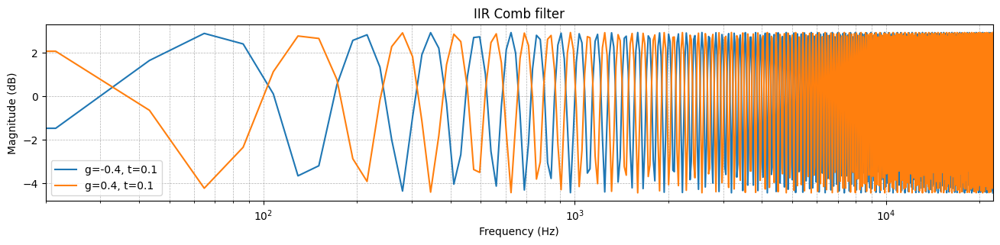

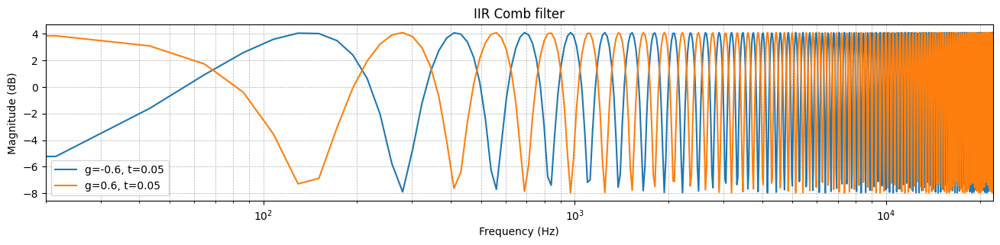

Delayed g=-0.4, t=0.1


Delayed g=0.4, t=0.1


Delayed g=-0.6, t=0.05


Delayed g=0.6, t=0.05


In [44]:

def iir_comb_filter(x, g, t, fs):
    N = len(x)
    
    y = np.zeros(N)
    c = 1 - g # unit gain
    M = int(t * fs)
    # for interpolation in case M is fractional
    frac =  (t * fs) - M

    for n in range(N):
        if M > n:
            y[n] = c * x[n]
            continue
            
        y[n] = c * x[n] + g * y[n - M]

        if frac != 0 and n > M:
            y[n] *= (1 - frac) + y[n - M - 1] * frac

    return y

gs = [-0.4, 0.4, -0.6 , 0.6]
ts = [0.1, 0.1, 0.05, 0.05 ]

def iir_comb_filter_freq_response(g, t, fs, n_points=1024):
    w = np.linspace(0, np.pi, n_points)
    H = np.zeros_like(w, dtype=complex)
    
    c = 1 - g # unit gain

    for i, omega in enumerate(w):
        z = np.exp(1j - omega)

        H[i] = c / (1 - g * z**-1)

    freqs = (w * fs) / (np.pi * 2)

    return freqs, 20 * np.log10(np.abs(H))

plt.figure(figsize=(16, 3))

def show_plot():
    plt.xscale('log')
    plt.xlim(20, fs / 2)  
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude (dB)")
    plt.title(f"IIR Comb filter")
    plt.legend()
    plt.grid(True, which="both", ls="--", lw=0.5)
    plt.show()


for g, t, color in zip(gs[:2], ts[:2], colors):
    freqs, mags = fir_comb_filter_freq_response(t, g, fs)
    plt.plot(freqs, mags, color=color, label=f"g={g}, t={t}")

show_plot()


plt.figure(figsize=(16, 3))

for g, t, color in zip(gs[2:], ts[2:], colors):
    freqs, mags = fir_comb_filter_freq_response(t, g, fs)
    plt.plot(freqs, mags, color=color, label=f"g={g}, t={t}")


show_plot()


for g, t in zip(gs, ts):
    print(f"Delayed g={g}, t={t}")
    delayed = iir_comb_filter(samples, g, t, fs)
    display(Audio(delayed, rate=fs))
